# Problem Statement:


### Definitions of Churn:
There are various ways to define churn, such as:

Revenue-based churn: Customers who have not utilised any revenue-generating facilities such as mobile internet, outgoing calls, SMS etc. over a given period of time. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.

The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

**`Usage-based churn:`** Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time. A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

This project demands usage-based definition to define churn

## Understanding Customer Behaviour During Churn
Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

The ‘action’ phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

The ‘churn’ phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

In this case, since we are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

### High-value Churn
In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

### As per the problem statement the high-value customers shoud be defined as:
Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [1]:
# import the required libraries

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns

import statsmodels
import statsmodels.api as sm

import sklearn
from sklearn.decomposition import PCA, IncrementalPCA

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.feature_selection import RFE

from sklearn.preprocessing import  MinMaxScaler, StandardScaler

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier 

# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz



from sklearn import linear_model, metrics
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, accuracy_score, roc_curve, auc

import warnings
warnings.filterwarnings('ignore')

In [2]:
churn = pd.read_csv("telecom_churn_data.csv")
churn.head()

# Read the data 

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [3]:
churn.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [4]:
null_perc = round(churn.isnull().mean()*100,2)
null_perc 

# saw the null percentages of each column

mobile_number     0.00
circle_id         0.00
loc_og_t2o_mou    1.02
std_og_t2o_mou    1.02
loc_ic_t2o_mou    1.02
                  ... 
aon               0.00
aug_vbc_3g        0.00
jul_vbc_3g        0.00
jun_vbc_3g        0.00
sep_vbc_3g        0.00
Length: 226, dtype: float64

In [5]:
high_null_perc_cols = null_perc[null_perc > 45]
high_null_perc_cols

# we see there is a lot of variables with hu=igh null percentage.

date_of_last_rech_data_6    74.85
date_of_last_rech_data_7    74.43
date_of_last_rech_data_8    73.66
date_of_last_rech_data_9    74.08
total_rech_data_6           74.85
total_rech_data_7           74.43
total_rech_data_8           73.66
total_rech_data_9           74.08
max_rech_data_6             74.85
max_rech_data_7             74.43
max_rech_data_8             73.66
max_rech_data_9             74.08
count_rech_2g_6             74.85
count_rech_2g_7             74.43
count_rech_2g_8             73.66
count_rech_2g_9             74.08
count_rech_3g_6             74.85
count_rech_3g_7             74.43
count_rech_3g_8             73.66
count_rech_3g_9             74.08
av_rech_amt_data_6          74.85
av_rech_amt_data_7          74.43
av_rech_amt_data_8          73.66
av_rech_amt_data_9          74.08
arpu_3g_6                   74.85
arpu_3g_7                   74.43
arpu_3g_8                   73.66
arpu_3g_9                   74.08
arpu_2g_6                   74.85
arpu_2g_7     

## Data Preprocessing and Derived Features


In [6]:
#Let's identify columns for recharge ('rech') as recharge columns will give us good idea on high value costomers
list_rech = [x for x in list(churn) if 'rech' in x]
print(list_rech) 

['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_num_9', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_amt_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9']


In [7]:

# Lets take the average of the total recharge amount in 'good' phase and assign it to a new derived column
churn['total_rech_avg_amt_good'] = (churn['total_rech_amt_6'] + churn['total_rech_amt_7'])/2
churn_modified = churn.copy()
churn_modified = churn_modified.drop(axis = 1, columns = ['total_rech_amt_6', 'total_rech_amt_7']) #we already have the information stored in the 'total_rech_avg_amt_good' column. So, let's drop the original columns
churn_modified.shape

(99999, 225)

In [8]:
#As per the problem statement, the high value customers are the ones with recharge amount higher than the 70th percentile
high_value_df = churn_modified[(churn_modified['total_rech_avg_amt_good'] > churn_modified['total_rech_avg_amt_good'].quantile(0.7))]
high_value_df.shape

(29979, 225)

In [9]:

#(As per the problem statement the churn should be derived based on the data usage 2g and 3g, 
# total incoming and outgoing calls, incoming calls in minutes per usage in the month of november.
high_value_df['total_usage'] = high_value_df['total_og_mou_9'] + high_value_df['total_ic_mou_9'] + high_value_df['vol_2g_mb_9'] + high_value_df['vol_3g_mb_9']

# And now derive a variable 'churn' with the help of 'total_usage' column.
high_value_df['churn'] = np.where(high_value_df['total_usage']== 0, 1, 0)
high_value_df.shape

(29979, 227)

In [10]:
# observe the churn and non-churn value counts
high_value_df['churn'].value_counts() 


0    27390
1     2589
Name: churn, dtype: int64

In [11]:
high_value_df['churn'].value_counts(normalize = True) # it says 8.6% and about to churn or already churned and clearly imbalanced.

0    0.91364
1    0.08636
Name: churn, dtype: float64

### Churn rate is too low, the data is clearly imbalanced.

In [12]:

#As we have already derived the 'churn' column, the 'total_usage' is of no use, Let's drop it
high_value_df.drop('total_usage', axis = 1, inplace = True)
high_value_df.shape

(29979, 226)

In [13]:

#Another important thing is that all the columns corresponding to 9 (september) is not relevent for us now.
#Because we want to predict the 'churn' of 9 based on the data from 6 and 7
#So, let's drop the other columns for the month of 9
sep_cols = [x for x in list(churn) if '_9' in x or 'sep' in x or 'Sep' in x or 'September' in x or 'september' in x]
high_value_df = high_value_df.drop(sep_cols, axis = 1)
high_value_df.shape

(29979, 171)

In [14]:

#getting the coulmns with only one unique value
cols_to_remove = []
for i in list(high_value_df):
    if len(high_value_df[i].value_counts()) == 1:
        cols_to_remove.append(i)
print(cols_to_remove)

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [15]:
#So, above columns should not have any predictive power and we can drop them
high_value_df = high_value_df.drop(cols_to_remove, axis = 1)
high_value_df.shape

(29979, 158)

In [16]:
#percentage of null values (non zero) in differend columns
col_list = list(high_value_df)
null = []
for i in high_value_df.isnull().sum()*100/high_value_df.shape[0]:
    null.append(i)
data = {'columns': col_list, '% null': null}
df_null = pd.DataFrame(data)
df_null[df_null['% null'] != 0]

,columns,% null
4,onnet_mou_6,1.054071
5,onnet_mou_7,1.010707
6,onnet_mou_8,3.128857
7,offnet_mou_6,1.054071
8,offnet_mou_7,1.010707
...,...,...
135,night_pck_user_7,61.132793
136,night_pck_user_8,60.835918
149,fb_user_6,62.016745
150,fb_user_7,61.132793


So, there are 114 columns having null values



In [17]:
#Let's check the columns with very large number (>= 50%) of null values
col_list = list(high_value_df)
null = []
for i in high_value_df.isnull().sum()*100/high_value_df.shape[0]:
    null.append(i)
data = {'columns': col_list, '% null': null}
df_null = pd.DataFrame(data)
df_null[df_null['% null'] >= 50].shape

(30, 2)

So there are 30 columns with very high null values



In [18]:
#Let's check how relevent these 30 columns are
correlation = []

lst = list(df_null[df_null['% null'] >= 50]['columns'])

NonNumCols = []
NumCols = []

for col in list(high_value_df[lst]):
    if high_value_df[lst][col].dtypes == 'object':
        NonNumCols.append(col)  
    else:
        NumCols.append(col)
        
for i in NumCols:
    corr = round(list(high_value_df[['churn', i]].corr()[i])[0], 3)
    correlation.append(corr)

print(correlation)

[0.017, 0.016, -0.028, -0.008, -0.004, -0.047, 0.009, 0.007, -0.021, 0.018, 0.019, -0.022, -0.012, -0.014, -0.057, 0.017, 0.006, -0.031, 0.021, 0.012, -0.028, 0.014, 0.007, -0.001, -0.021, -0.013, -0.084]


It shows there is poor correlation between the **` high null numerical columns`** and **`churn`**

In [19]:
len(NumCols)

27

In [20]:
res = high_value_df[NumCols]
res.columns

Index(['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7',
       'arpu_2g_8', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'fb_user_6', 'fb_user_7', 'fb_user_8'],
      dtype='object')

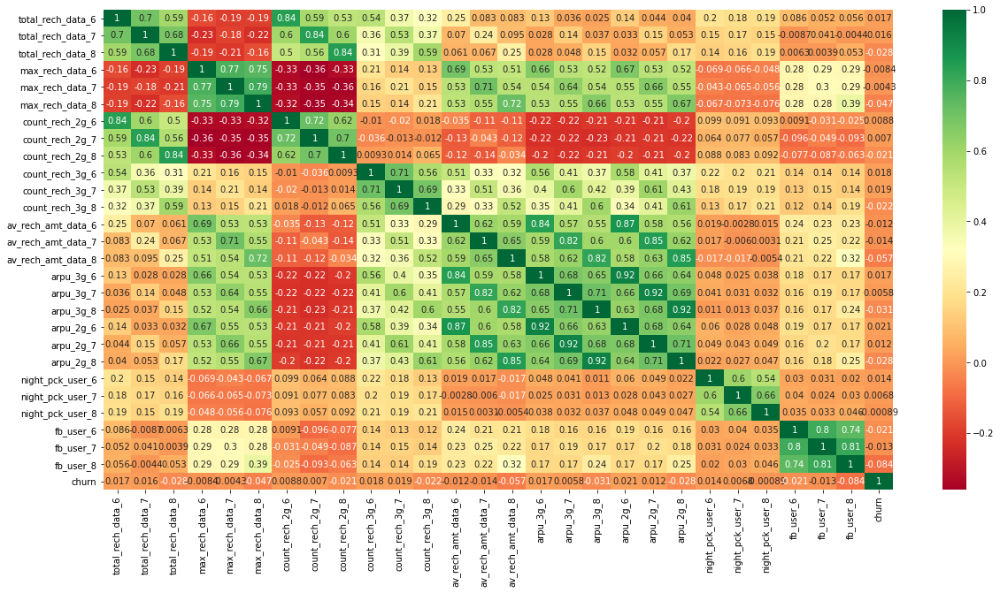

In [21]:
res = high_value_df[['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7',
       'arpu_2g_8', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'fb_user_6', 'fb_user_7', 'fb_user_8', 'churn']]

# Let's see the heatmap 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(res.corr(),annot = True , cmap = 'RdYlGn')

Note: Almost there is no correlation between these 27 columns and churn



In [22]:
#Looks like that all the numerical columns with very high (>= 50%) null values are not of much importance for our model building.
#So, we can drop these columns
high_value_df = high_value_df.drop(NumCols, axis = 1)
high_value_df.shape

(29979, 131)

In [23]:
NonNumCols

['date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

In [24]:
#imputing the missing values in NonNumCols with mode.
for i in NonNumCols:
    high_value_df[i].fillna(high_value_df[i].mode()[0], inplace=True)

In [25]:
#List of columns related to 'date'
cols_date = [x for x in list(high_value_df) if 'date' in x]
print(cols_date)

['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8']


In [26]:
#Extracting day from the date
for i in cols_date:
    high_value_df[i] = pd.to_datetime(high_value_df[i]).dt.day

In [27]:
#imputing with median value
col_null = high_value_df.columns[high_value_df.isnull().sum() > 0]
for i in col_null:
    high_value_df[i].fillna((high_value_df[i].median()), inplace=True)

In [28]:
#Checking whether imputation is complete or not
col_list = list(high_value_df)
null = []
for i in high_value_df.isnull().sum()*100/high_value_df.shape[0]:
    null.append(i)
data = {'columns': col_list, '% null': null}
df_null = pd.DataFrame(data)
df_null[df_null['% null'] != 0]

,columns,% null


So, there is no null value now, handled missing values well.

In [29]:
high_value_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_avg_amt_good,churn
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,0,0,0,315,21.03,910.65,122.16,519.0,0
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,...,0,0,0,0,2607,0.00,0.00,0.00,380.0,0
16,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,...,0,0,0,0,511,0.00,2.45,21.89,459.0,0
17,7000187447,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,...,0,0,0,0,667,0.00,0.00,0.00,408.0,0


In [30]:
#Checking number of numerical and non-numerical columns
NonNumCols = []
NumCols = []

for col in list(high_value_df):
    if high_value_df[col].dtypes == 'object':
        NonNumCols.append(col)  
    else:
        NumCols.append(col)
        
print('Number of numerical columns:' ,len(NumCols))
print('Number of non-numerical columns:', len(NonNumCols))

Number of numerical columns: 131
Number of non-numerical columns: 0


# Outlier Treatment

In [31]:
high_value_df.describe(percentiles=[0.01, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])


,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_avg_amt_good,churn
count,2.997900e+04,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,...,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000
mean,7.001223e+09,587.587624,589.424681,535.067748,297.590611,305.886840,271.137938,421.142281,426.990330,383.029940,...,0.173321,0.138063,0.150339,0.140498,1264.158911,129.482436,135.225368,121.450911,697.014644,0.08636
std,6.846594e+05,442.848876,463.049067,492.447887,460.257092,481.318377,465.205131,468.998414,485.030117,473.464516,...,0.583178,0.875984,0.969779,0.975212,975.181038,390.625027,408.218570,389.910814,488.925223,0.28090
min,7.000000e+09,-2258.709000,-2014.045000,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,369.000000,0.00000
1%,7.000028e+09,18.221200,25.600600,0.000000,0.000000,0.000000,0.000000,1.057800,1.099000,0.000000,...,0.000000,0.000000,0.000000,0.000000,189.000000,0.000000,0.000000,0.000000,371.500000,0.00000
10%,7.000269e+09,270.692200,274.458200,134.118600,12.230000,11.726000,6.906000,58.606000,59.604000,35.072000,...,0.000000,0.000000,0.000000,0.000000,294.000000,0.000000,0.000000,0.000000,397.000000,0.00000
25%,7.000641e+09,364.352500,365.235000,289.782000,43.590000,43.370000,34.060000,142.860000,141.280000,111.780000,...,0.000000,0.000000,0.000000,0.000000,480.000000,0.000000,0.000000,0.000000,450.000000,0.00000
50%,7.001232e+09,495.951000,493.781000,452.232000,128.480000,128.120000,106.390000,285.990000,285.630000,251.530000,...,0.000000,0.000000,0.000000,0.000000,914.000000,0.000000,0.000000,0.000000,569.000000,0.00000
75%,7.001814e+09,704.184500,700.986000,671.349500,353.500000,360.360000,298.215000,523.625000,532.905000,483.000000,...,0.000000,0.000000,0.000000,0.000000,1923.500000,1.600000,2.025000,0.000000,796.000000,0.00000
90%,7.002167e+09,994.311800,996.051400,985.499200,795.354000,825.486000,724.182000,916.490000,935.716000,854.006000,...,1.000000,0.000000,0.000000,0.000000,2846.000000,439.100000,455.078000,395.168000,1118.100000,0.00000


In [32]:
#Removing the entries above 99 percentile and below 1 percentile
cols = [col for col in list(high_value_df) if col not in ['churn','mobile_number']]

for col in cols:
    ptls = high_value_df[col].quantile([0.01,0.99]).values
    high_value_df[col][high_value_df[col] <= ptls[0]] = ptls[0]
    high_value_df[col][high_value_df[col] >= ptls[1]] = ptls[1]

In [33]:
high_value_df.describe(percentiles=[0.01, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99])


,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_avg_amt_good,churn
count,2.997900e+04,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,...,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000
mean,7.001223e+09,578.115790,579.934200,524.618925,288.909740,296.580898,261.866393,413.363109,418.408660,373.082685,...,0.163815,0.100304,0.103239,0.093966,1263.461223,120.468609,126.130999,112.271333,686.128273,0.08636
std,6.846594e+05,336.036348,338.202040,370.788082,404.375323,419.262037,398.634242,420.037947,429.176148,401.058913,...,0.505309,0.427528,0.442786,0.431060,973.137375,318.585454,337.364761,313.189126,347.666592,0.28090
min,7.000000e+09,18.221200,25.600600,0.000000,0.000000,0.000000,0.000000,1.057800,1.099000,0.000000,...,0.000000,0.000000,0.000000,0.000000,189.000000,0.000000,0.000000,0.000000,371.500000,0.00000
1%,7.000028e+09,18.228064,25.732732,0.000000,0.000000,0.000000,0.000000,1.059516,1.107580,0.000000,...,0.000000,0.000000,0.000000,0.000000,189.000000,0.000000,0.000000,0.000000,371.500000,0.00000
10%,7.000269e+09,270.692200,274.458200,134.118600,12.230000,11.726000,6.906000,58.606000,59.604000,35.072000,...,0.000000,0.000000,0.000000,0.000000,294.000000,0.000000,0.000000,0.000000,397.000000,0.00000
25%,7.000641e+09,364.352500,365.235000,289.782000,43.590000,43.370000,34.060000,142.860000,141.280000,111.780000,...,0.000000,0.000000,0.000000,0.000000,480.000000,0.000000,0.000000,0.000000,450.000000,0.00000
50%,7.001232e+09,495.951000,493.781000,452.232000,128.480000,128.120000,106.390000,285.990000,285.630000,251.530000,...,0.000000,0.000000,0.000000,0.000000,914.000000,0.000000,0.000000,0.000000,569.000000,0.00000
75%,7.001814e+09,704.184500,700.986000,671.349500,353.500000,360.360000,298.215000,523.625000,532.905000,483.000000,...,0.000000,0.000000,0.000000,0.000000,1923.500000,1.600000,2.025000,0.000000,796.000000,0.00000
90%,7.002167e+09,994.311800,996.051400,985.499200,795.354000,825.486000,724.182000,916.490000,935.716000,854.006000,...,1.000000,0.000000,0.000000,0.000000,2846.000000,439.100000,455.078000,395.168000,1118.100000,0.00000


In [34]:
high_value_df.shape


(29979, 131)

# EDA

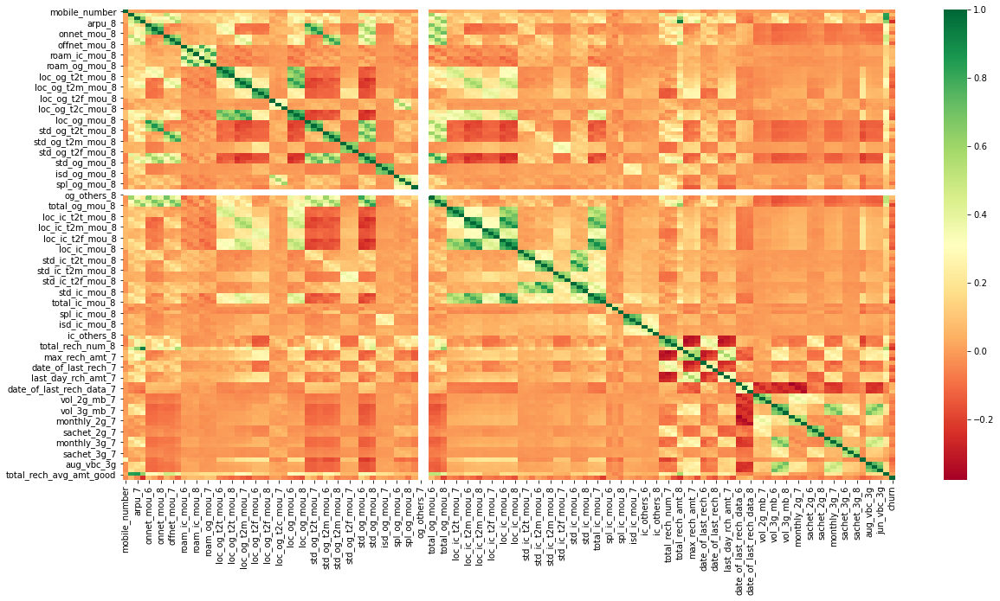

In [35]:
#Correlations
res1 = high_value_df.corr()
plt.figure(figsize = (20,10))
sns.heatmap(res1,cmap = 'RdYlGn')

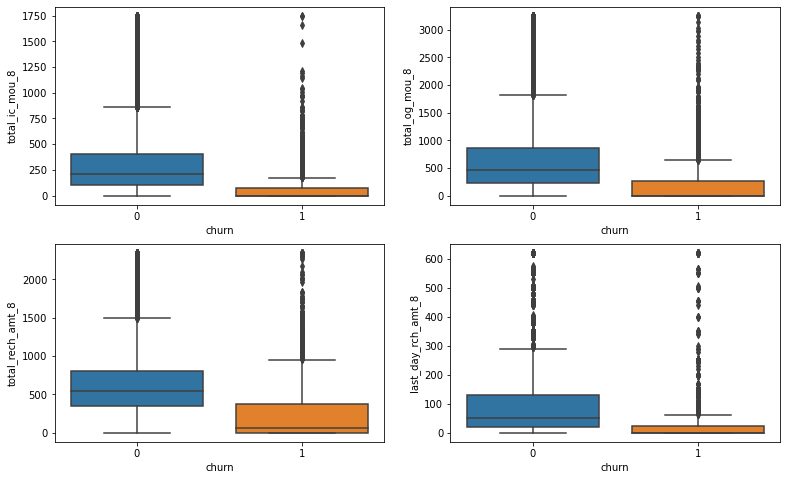

In [36]:
#Some important features
fig = plt.figure(figsize=(13,8))

plt.subplot(2,2,1)
sns.boxplot(x='churn', y='total_ic_mou_8', data = high_value_df)

plt.subplot(2,2,2)
sns.boxplot(x='churn', y='total_og_mou_8', data = high_value_df)

plt.subplot(2,2,3)
sns.boxplot(x='churn', y='total_rech_amt_8', data = high_value_df)

plt.subplot(2,2,4)
sns.boxplot(x='churn', y='last_day_rch_amt_8', data = high_value_df)

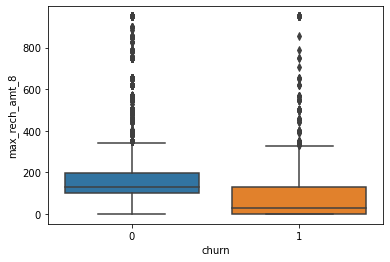

In [37]:
sns.boxplot(x='churn', y='max_rech_amt_8', data = high_value_df)


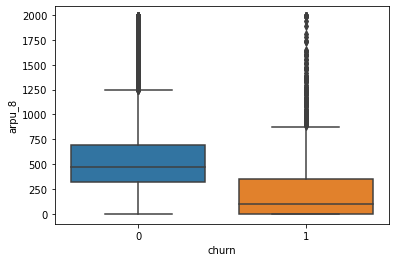

In [38]:
sns.boxplot(x='churn', y='arpu_8', data = high_value_df)


In [ ]:
# It is clearly seen from boxplots that customers who are so much valuable are getting churned, might have some strong reason.

## Scaling

In [40]:
#instantiated scaler
scaler = StandardScaler()


X = high_value_df.drop(['churn','mobile_number'], axis=1)

y = high_value_df['churn']

In [41]:
X_scaled = scaler.fit_transform(X)


In [42]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.7, test_size=0.3, random_state=100)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (20985, 129)
y_train shape: (20985,)
X_test shape: (8994, 129)
y_test shape: (8994,)


# PCA

In [43]:
pca = PCA(svd_solver = 'randomized', random_state = 42)


In [44]:
#doing the PCA on X_train
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [45]:
pca.components_


array([[ 8.51923498e-02,  9.09253315e-02,  1.05437427e-01, ...,
         6.22423862e-02,  5.87374949e-02,  9.98693649e-02],
       [ 1.25939947e-01,  1.61270126e-01,  1.51340675e-01, ...,
        -6.89059392e-02, -6.85765538e-02,  1.63026916e-01],
       [ 9.94445207e-02,  1.37439955e-01,  1.39686622e-01, ...,
         2.00366718e-01,  1.91522496e-01,  1.35510770e-01],
       ...,
       [-1.44904287e-03,  5.68573714e-03, -1.20193488e-03, ...,
         1.74361586e-04,  2.04688470e-04, -9.38226879e-04],
       [-0.00000000e+00,  1.74454831e-17, -8.03794687e-17, ...,
        -6.49903833e-17,  3.28199813e-16,  7.10117578e-17],
       [-0.00000000e+00,  4.86258699e-17,  1.22534867e-18, ...,
         2.03172583e-17, -1.81142312e-16, -6.85348378e-18]])

In [46]:
pca.explained_variance_ratio_


array([1.14156320e-01, 9.08194612e-02, 5.96756775e-02, 4.98655159e-02,
       4.18111194e-02, 3.71421256e-02, 2.88174376e-02, 2.75806679e-02,
       2.63106415e-02, 2.47115396e-02, 2.38755014e-02, 2.34275253e-02,
       2.00544324e-02, 1.91245273e-02, 1.72284853e-02, 1.63022875e-02,
       1.56117863e-02, 1.28859709e-02, 1.19539537e-02, 1.15220543e-02,
       1.10878919e-02, 1.08005242e-02, 1.02638551e-02, 9.56318692e-03,
       9.09547163e-03, 8.65438932e-03, 8.46734560e-03, 8.15471631e-03,
       7.88395265e-03, 7.43440707e-03, 7.37873013e-03, 7.14616069e-03,
       6.89663830e-03, 6.68175366e-03, 6.61708171e-03, 6.39380112e-03,
       6.30538370e-03, 6.18857052e-03, 6.10135567e-03, 5.93971751e-03,
       5.83751296e-03, 5.77870079e-03, 5.61518995e-03, 5.33940686e-03,
       5.23069235e-03, 5.15436561e-03, 5.04277620e-03, 4.85827652e-03,
       4.62879201e-03, 4.53076332e-03, 4.43256952e-03, 4.33806385e-03,
       4.02936636e-03, 3.81725570e-03, 3.68271515e-03, 3.53174332e-03,
      

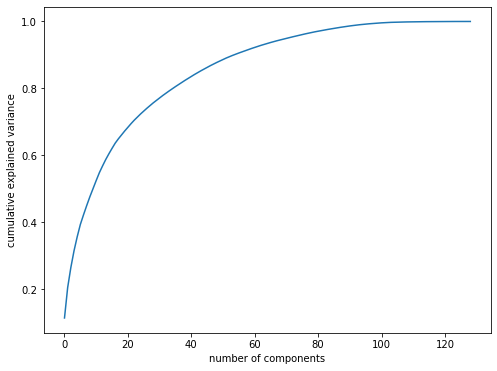

In [47]:
 %matplotlib inline
fig = plt.figure(figsize = (8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [48]:

pca_final = IncrementalPCA(n_components=20) #20 components are enough to explain >90% variance

X_train_pca = pca_final.fit_transform(X_train) #PCA on train dataset
X_train_pca.shape

(20985, 20)

In [49]:

#Maximum and minimum correlations after PCA
corr = np.corrcoef(X_train_pca.transpose())
corr_nodiag = corr - np.diagflat(corr.diagonal())
print("max_corr:", corr_nodiag.max(), 'and', "min_corr:", corr_nodiag.min(),)

max_corr: 0.0033682534771550827 and min_corr: -0.006748229859278343


So, after PCA we dont have any multicolinearity



In [50]:

#PCA on test data
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(8994, 20)

## Model Building


### Logistic Regression with PCA

In [51]:
# Instatiated the model
lr_pca = LogisticRegression(class_weight='balanced') #class_weight='balanced' was used due to class imbalance in the dataset

# fit the model
model_lr_pca = lr_pca.fit(X_train_pca, y_train)

In [52]:
#predictions on train dataset
pred_train = model_lr_pca.predict_proba(X_train_pca)
y_pred_train = model_lr_pca.predict(X_train_pca)

#predictions on test dataset
pred_test = model_lr_pca.predict_proba(X_test_pca)
y_pred_test = model_lr_pca.predict(X_test_pca)

In [53]:
# Print confusion matrix, accuracy on training and test sets+96+
print(confusion_matrix(y_train, y_pred_train))
print('Accuracy Score in train dataset:', accuracy_score(y_train, y_pred_train))
print('Accuracy Score in test dataset:', accuracy_score(y_test, y_pred_test))

[[15743  3468]
 [  311  1463]]
Accuracy Score in train dataset: 0.8199189897545867
Accuracy Score in test dataset: 0.8186568823660217


In [54]:

y_pred_df = pd.DataFrame(pred_train) #converting array to dataframe
y_pred_df_test = pd.DataFrame(pred_test)

y_pred = y_pred_df.iloc[:,[1]] #Converting to column dataframe
y_pred_test = y_pred_df_test.iloc[:,[1]]

y_pred.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
y_pred_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

y_pred_final = pd.concat([y_train, y_pred], axis=1)
y_pred_final_test = pd.concat([y_test, y_pred_test], axis=1)
 
y_pred_final = y_pred_final.rename(columns = { 1 : 'churn_prob'}) #Renaming the column
y_pred_final_test = y_pred_final_test.rename(columns = { 1 : 'churn_prob'})

In [55]:
#ROC
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

In [56]:

#AUC
fpr, tpr, thresholds =roc_curve(y_pred_final.churn, y_pred_final.churn_prob)
auc = auc(fpr, tpr)
print('AUC:', auc)

AUC: 0.8778139485451922


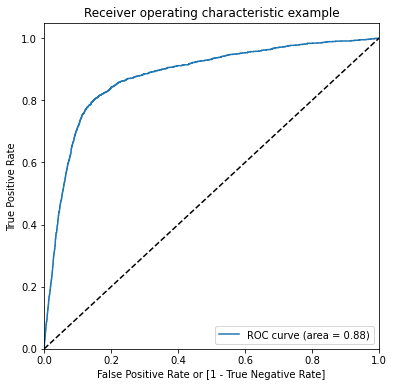

(array([0.        , 0.        , 0.        , ..., 0.99989589, 0.99994795,
        1.        ]),
 array([0.00000000e+00, 5.63697858e-04, 1.12739572e-03, ...,
        1.00000000e+00, 1.00000000e+00, 1.00000000e+00]),
 array([1.99931903e+00, 9.99319025e-01, 9.98286234e-01, ...,
        8.00825932e-05, 6.33372901e-05, 1.77029145e-05]))

In [57]:
draw_roc(y_pred_final.churn, y_pred_final.churn_prob)


In [58]:
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i] = y_pred_final.churn_prob.map( lambda x: 1 if x > i else 0)
#y_pred_final.head()

In [59]:

#Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.084537  0.000000  1.000000
0.1   0.1  0.330093  0.270470  0.975761
0.2   0.2  0.505790  0.465567  0.941375
0.3   0.3  0.645318  0.621207  0.906426
0.4   0.4  0.748344  0.736974  0.871477
0.5   0.5  0.819919  0.819478  0.824690
0.6   0.6  0.867620  0.876737  0.768884
0.7   0.7  0.894020  0.915934  0.656708
0.8   0.8  0.909126  0.948779  0.479707
0.9   0.9  0.914367  0.978190  0.223224


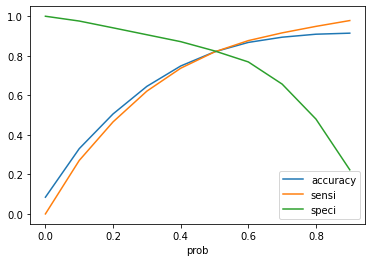

In [60]:

#accuracy vs. sensitivity vs. specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])

In [61]:
#Creating new column 'pred_churn' with 1 if churn_prob > 0.52 else 0
y_pred_final['pred_churn'] = y_pred_final.churn_prob.map( lambda x: 1 if x > 0.50 else 0)

y_pred_final.churn.value_counts()

0    19211
1     1774
Name: churn, dtype: int64

In [62]:

# Confusion matrix 
confusion = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.pred_churn)
confusion

array([[15743,  3468],
       [  311,  1463]], dtype=int64)

In [63]:
TP = confusion[1,1] #true positive 
TN = confusion[0,0] #true negative
FP = confusion[0,1] #false positive
FN = confusion[1,0] #false negative

print('Accuracy Score:', accuracy_score(y_train, y_pred_final['pred_churn']))
print('Sensitivity:', TP/float(TP+FN))
print('Specificity:', TN/float(TN+FP))
print('False Postive Rate:', FP/float(TN+FP))
print('Positive Predictive Value:', TP/float(TP+FP))
print('Negative Predictive Value:',TN/float(TN+ FN))
print('Misclassification Rate:', (FN+FP)/(TP+TN+FP+FN))

Accuracy Score: 0.8199189897545867
Sensitivity: 0.8246899661781285
Specificity: 0.8194784238196866
False Postive Rate: 0.18052157618031336
Positive Predictive Value: 0.2966943824781991
Negative Predictive Value: 0.9806278809019559
Misclassification Rate: 0.1800810102454134


In [64]:
#churn prediction in test dataset
y_pred_final_test['pred_churn'] = y_pred_final_test.churn_prob.map( lambda x: 1 if x > 0.50 else 0)
confusion = metrics.confusion_matrix(y_pred_final_test.churn, y_pred_final_test.pred_churn)

TP = confusion[1,1] #true positive 
TN = confusion[0,0] #true negative
FP = confusion[0,1] #false positive
FN = confusion[1,0] #false negative

print('Accuracy Score:', accuracy_score(y_test, y_pred_final_test['pred_churn']))
print('Sensitivity:', TP/float(TP+FN))
print('Specificity:', TN/float(TN+FP))
print('False Postive Rate:', FP/float(TN+FP))
print('Positive Predictive Value:', TP/float(TP+FP))
print('Negative Predictive Value:',TN/float(TN+ FN))
print('Misclassification Rate:', (FN+FP)/(TP+TN+FP+FN))

Accuracy Score: 0.8186568823660217
Sensitivity: 0.8171779141104294
Specificity: 0.8188042547988752
False Postive Rate: 0.18119574520112483
Positive Predictive Value: 0.3100558659217877
Negative Predictive Value: 0.9782354659655274
Misclassification Rate: 0.1813431176339782


In [65]:

from sklearn.model_selection  import StratifiedKFold
st_Kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=9999)

In [66]:
from sklearn.linear_model import LogisticRegressionCV

searchCV = LogisticRegressionCV(Cs= list(np.power(10.0, np.arange(-10, 10))), penalty='l2', scoring='roc_auc', cv=st_Kfold, 
                                random_state=999, max_iter=100, fit_intercept=True, solver='newton-cg', tol=1, verbose = 2,
                                n_jobs = -1)

In [67]:
searchCV.fit(X_train_pca, y_train)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.2s finished


LogisticRegressionCV(Cs=[1e-10, 1e-09, 1e-08, 1e-07, 1e-06, 1e-05, 0.0001,
                         0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0,
                         100000.0, 1000000.0, 10000000.0, 100000000.0,
                         1000000000.0],
                     cv=StratifiedKFold(n_splits=5, random_state=9999, shuffle=True),
                     n_jobs=-1, random_state=999, scoring='roc_auc',
                     solver='newton-cg', tol=1, verbose=2)

In [68]:
from sklearn.metrics import classification_report
pred_L2Search_train = searchCV.predict(X_train_pca)
pred_L2Search_test = searchCV.predict(X_test_pca)
pred_L2Search_prob_train = searchCV.predict_proba(X_train_pca)[:,1]
pred_L2Search_prob_test = searchCV.predict_proba(X_train_pca)[:,1]
print('Report for the train dataset:', '\n', classification_report(y_train, pred_L2Search_train))
print('Report for the test dataset:', '\n', classification_report(y_test, pred_L2Search_test))

accuracy_train = metrics.accuracy_score(y_train, pred_L2Search_train)
accuracy_test = metrics.accuracy_score(y_test, pred_L2Search_test)
print("Accuracy in train dataset:", accuracy_train)
print("Accuracy in test dataset:", accuracy_test)

Report for the train dataset: 
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     19211
           1       0.54      0.17      0.26      1774

    accuracy                           0.92     20985
   macro avg       0.73      0.58      0.61     20985
weighted avg       0.89      0.92      0.90     20985

Report for the test dataset: 
               precision    recall  f1-score   support

           0       0.92      0.99      0.95      8179
           1       0.56      0.17      0.26       815

    accuracy                           0.91      8994
   macro avg       0.74      0.58      0.61      8994
weighted avg       0.89      0.91      0.89      8994

Accuracy in train dataset: 0.9174648558494163
Accuracy in test dataset: 0.9126084056037358


In [69]:

confusion = confusion_matrix(y_train, pred_L2Search_train)
confusion

array([[18951,   260],
       [ 1472,   302]], dtype=int64)

In [70]:

TP = confusion[1,1] #true positive 
TN = confusion[0,0] #true negative
FP = confusion[0,1] #false positive
FN = confusion[1,0] #false negative

print('Accuracy Score:', accuracy_score(y_train, pred_L2Search_train))
print('Sensitivity:', TP/float(TP+FN))
print('Specificity:', TN/float(TN+FP))
print('False Postive Rate:', FP/float(TN+FP))
print('Positive Predictive Value:', TP/float(TP+FP))
print('Negative Predictive Value:',TN/float(TN+ FN))
print('Misclassification Rate:', (FN+FP)/(TP+TN+FP+FN))

Accuracy Score: 0.9174648558494163
Sensitivity: 0.17023675310033823
Specificity: 0.9864660871375774
False Postive Rate: 0.013533912862422571
Positive Predictive Value: 0.5373665480427047
Negative Predictive Value: 0.9279243989619547
Misclassification Rate: 0.08253514415058374


In [71]:

confusion = confusion_matrix(y_test, pred_L2Search_test)
confusion

array([[8071,  108],
       [ 678,  137]], dtype=int64)

In [72]:
TP = confusion[1,1] #true positive 
TN = confusion[0,0] #true negative
FP = confusion[0,1] #false positive
FN = confusion[1,0] #false negative

print('Accuracy Score:', accuracy_score(y_test, pred_L2Search_test))
print('Sensitivity:', TP/float(TP+FN))
print('Specificity:', TN/float(TN+FP))
print('False Postive Rate:', FP/float(TN+FP))
print('Positive Predictive Value:', TP/float(TP+FP))
print('Negative Predictive Value:',TN/float(TN+ FN))
print('Misclassification Rate:', (FN+FP)/(TP+TN+FP+FN))

Accuracy Score: 0.9126084056037358
Sensitivity: 0.16809815950920245
Specificity: 0.9867954517667197
False Postive Rate: 0.013204548233280352
Positive Predictive Value: 0.5591836734693878
Negative Predictive Value: 0.9225054291919077
Misclassification Rate: 0.08739159439626418


## Random Forest with PCA

In [73]:
rf_balanced = RandomForestClassifier(class_weight="balanced_subsample", n_estimators = 1000, max_depth = 6, min_samples_split=5)

In [74]:
trained_rf = rf_balanced.fit(X_train_pca, y_train)


In [75]:
trained_rf.estimators_[0]

DecisionTreeClassifier(max_depth=6, max_features='auto', min_samples_split=5,
                       random_state=208345807)

In [76]:

pred_rf_train = trained_rf.predict(X_train_pca)
pred_rf_test = trained_rf.predict(X_test_pca)
pred_prob_rf_train = trained_rf.predict_proba(X_train_pca)[:,1]
pred_prob_rf_test = trained_rf.predict_proba(X_test_pca)[:,1]

accuracy_train = metrics.accuracy_score(y_train, pred_rf_train)
accuracy_test = metrics.accuracy_score(y_test, pred_rf_test)

print('Accuracy in train dataset:', accuracy_train)
print('Accuracy in test dataset:', accuracy_test)

print('Classification report on train dataset:', '\n', classification_report(y_train, pred_rf_train))
print('Classification report on test dataset:', '\n', classification_report(y_test, pred_rf_test))

Accuracy in train dataset: 0.8688110555158447
Accuracy in test dataset: 0.8576828997109184
Classification report on train dataset: 
               precision    recall  f1-score   support

           0       0.98      0.87      0.92     19211
           1       0.37      0.82      0.51      1774

    accuracy                           0.87     20985
   macro avg       0.68      0.85      0.72     20985
weighted avg       0.93      0.87      0.89     20985

Classification report on test dataset: 
               precision    recall  f1-score   support

           0       0.97      0.87      0.92      8179
           1       0.36      0.73      0.48       815

    accuracy                           0.86      8994
   macro avg       0.66      0.80      0.70      8994
weighted avg       0.91      0.86      0.88      8994



ROC AUC in train dataset 0.9130432014212075


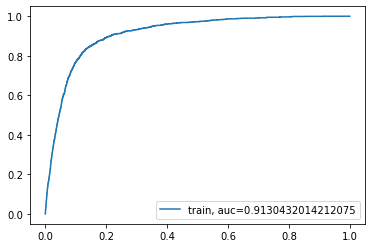

In [77]:

#ROC in train dataset
fpr, tpr, threshold = metrics.roc_curve(y_train, pred_prob_rf_train)
auc = metrics.auc(fpr, tpr)
print("ROC AUC in train dataset", auc)
plt.plot(fpr, tpr, label = "train, auc=" + str(auc))
plt.legend(loc = 4)
plt.show()

ROC AUC in train dataset 0.8772473572526378


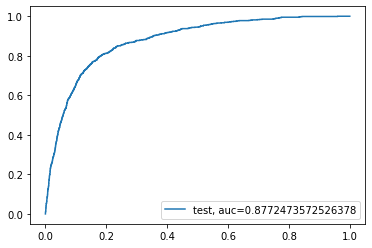

In [78]:

#ROC in test dataset
fpr, tpr, threshold = metrics.roc_curve(y_test, pred_prob_rf_test)
auc = metrics.auc(fpr, tpr)
print("ROC AUC in train dataset", auc)
plt.plot(fpr, tpr, label = "test, auc=" + str(auc))
plt.legend(loc = 4)
plt.show()

## Decision Tree and Random Forest with all features

In [79]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [80]:
from sklearn.tree import DecisionTreeClassifier
dt_all = DecisionTreeClassifier(class_weight='balanced', max_depth = 6) # without hyper parameter tuning
dt_all.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=6)

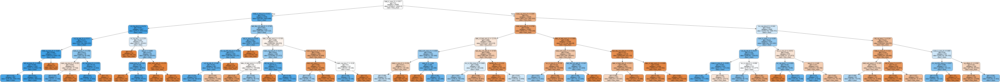

In [81]:
dot_data = StringIO()  

export_graphviz(dt_all, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['Non_churn', "churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png(),width=800,height=900)


In [82]:
def get_dt_graph(dt_all):
    dot_data = StringIO()
    export_graphviz(dt_all, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['Non_churn', "churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [83]:
def evaluate_model(dt_all):
    print("Train Accuracy :", accuracy_score(y_train, dt_all.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_all.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_all.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_all.predict(X_test)))

In [84]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 4, 6, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [85]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt_all, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [86]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   41.7s finished


Wall time: 43.5 s


GridSearchCV(cv=4,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=6),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [87]:
grid_search.best_estimator_ # we got the best params, now we shall fit the model on best parameters

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, min_samples_leaf=5)

In [88]:
dt_best = grid_search.best_estimator_

In [89]:
evaluate_model(dt_best)

Train Accuracy : 0.9676435549201811
Train Confusion Matrix:
[[18532   679]
 [    0  1774]]
--------------------------------------------------
Test Accuracy : 0.9057149210584834
Test Confusion Matrix:
[[7625  554]
 [ 294  521]]


In [ ]:
# Got the test set accuracy of 90.57 % which is great, but we shall compare it with random forests

In [90]:
# gph = get_dt_graph(dt_best)
# Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.833681 to fit



### Random Forest without PCA:

In [91]:
# instantiated with some random hyperparameters
rf_all = RandomForestClassifier(class_weight='balanced', n_estimators = 1000, max_depth = 6, min_samples_split=5)

In [92]:
trained_rf_all = rf_all.fit(X_train, y_train)
# fit the model

In [93]:
trained_rf_all.estimators_[0]

DecisionTreeClassifier(max_depth=6, max_features='auto', min_samples_split=5,
                       random_state=1016045370)

In [94]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 4, 6, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50],
    'max_features': [4, 6, 8, 10],
    'n_estimators': [200, 500, 1000, 2000]
}

In [95]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=trained_rf_all, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [96]:
%%time 
grid_search.fit(X_train, y_train)


Fitting 4 folds for each of 320 candidates, totalling 1280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 59.3min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed: 139.3min
[Parallel(n_jobs=-1)]: Done 1280 out of 1280 | elapsed: 148.8min finished


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=6, min_samples_split=5,
                                              n_estimators=1000),
             n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6, 10, 20],
                         'max_features': [4, 6, 8, 10],
                         'min_samples_leaf': [5, 10, 20, 50],
                         'n_estimators': [200, 500, 1000, 2000]},
             scoring='accuracy', verbose=1)

In [97]:
rf_best = grid_search.best_estimator_

In [98]:
rf_best # got the best parameters after hyperparameter tuning

RandomForestClassifier(class_weight='balanced', max_depth=20, max_features=10,
                       min_samples_leaf=5, min_samples_split=5,
                       n_estimators=1000)

In [99]:
evaluate_model(rf_best)

Train Accuracy : 0.9812723373838456
Train Confusion Matrix:
[[18825   386]
 [    7  1767]]
--------------------------------------------------
Test Accuracy : 0.9381810095619302
Test Confusion Matrix:
[[7956  223]
 [ 333  482]]


- Clearly, shows random forests gave us best acuracy score on test set of 93.81% , by far best among the models we used .

In [100]:
sample_tree = rf_best.estimators_[0] 

In [101]:
# gph = get_dt_graph(sample_tree)
# Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.766336 to fit



## Feature importance for business understanding:

In [102]:
classifier_rf = RandomForestClassifier(random_state=42, class_weight='balanced', max_depth=20, max_features=10,
                                       min_samples_leaf=5, min_samples_split=5, n_estimators=1000, oob_score=True)

In [103]:
classifier_rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20, max_features=10,
                       min_samples_leaf=5, min_samples_split=5,
                       n_estimators=1000, oob_score=True, random_state=42)

In [104]:
classifier_rf.feature_importances_

array([0.00574952, 0.00733157, 0.03807008, 0.00574756, 0.00586904,
       0.00809872, 0.00507812, 0.0054827 , 0.0117635 , 0.00221815,
       0.00398091, 0.03006964, 0.00199951, 0.00449297, 0.03242041,
       0.00457635, 0.00483997, 0.01906913, 0.00482674, 0.0060041 ,
       0.02513027, 0.00362791, 0.00331868, 0.01393771, 0.00132201,
       0.0016424 , 0.0019952 , 0.00498869, 0.00680291, 0.02928605,
       0.00446439, 0.00439362, 0.00597994, 0.00416318, 0.00445725,
       0.00690431, 0.00079432, 0.00097561, 0.00075866, 0.00568859,
       0.00650249, 0.00888582, 0.0007551 , 0.00119188, 0.00090386,
       0.00275478, 0.00383831, 0.00674122, 0.0013126 , 0.        ,
       0.        , 0.00565647, 0.00715411, 0.05613172, 0.004538  ,
       0.00559475, 0.01950942, 0.00503234, 0.00675684, 0.03169421,
       0.00349416, 0.00436791, 0.0151152 , 0.00499709, 0.00688104,
       0.03179613, 0.00315867, 0.00353962, 0.00574966, 0.00370723,
       0.00370423, 0.00857262, 0.0011235 , 0.00118052, 0.00324

In [106]:
# created a data frame with variable name and its importance
imp_df = pd.DataFrame({
    "Varname": X.columns,
    "Imp": classifier_rf.feature_importances_
})

In [109]:
top_10 = imp_df.sort_values(by="Imp", ascending=False).head(10)
top_10

,Varname,Imp
80,total_ic_mou_8,0.070933
53,total_og_mou_8,0.056132
93,total_rech_amt_8,0.052901
102,last_day_rch_amt_8,0.050774
2,arpu_8,0.038070
99,date_of_last_rech_8,0.036108
14,roam_og_mou_8,0.032420
65,loc_ic_mou_8,0.031796
59,loc_ic_t2m_mou_8,0.031694
11,roam_ic_mou_8,0.030070


**`Conclusion:`** Inorder to say the customer is curned or about to churn, **`total_ic_mou_8`**, **`total_og_mou_8`**, **`total_rech_amt_8`**, **`last_day_rch_amt_8`** are the top 4 features the telecom company must concentrate on. The is the 3rd month, i.e., action phase is most important to decide weather he is churned or about to churn.